In [1]:
import cv2
import numpy as np


from utils import dataset, perspective, sift, visual

In [2]:
# Show Big images in the notebook

import matplotlib
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (20.0, 10.0)

# Dataset

In [3]:
PATH_DATASET = 'data/01'

In [4]:
data = dataset.load(PATH_DATASET)
imgs = data['imgs']
shape_canonical = data['shape_canonical']

# Rectify images

## Perspective (Pose estimation)


Perspective transformation(homography)
* https://docs.opencv.org/3.4.0/da/d6e/tutorial_py_geometric_transformations.html
* http://scikit-image.org/docs/dev/auto_examples/xx_applications/plot_geometric.html

In [5]:
for img in imgs:
    # Rectified image
    img['img'],_ = perspective.rectify(
        rectified_shape=np.float32(shape_canonical),
        img=cv2.imread(img['path']),
        roi=np.float32(img['shape'])
    )

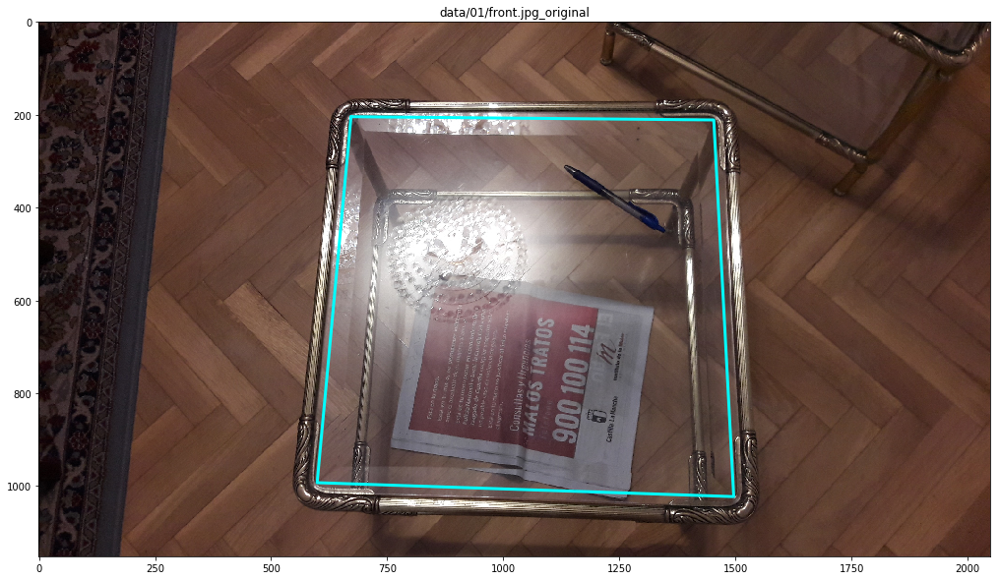

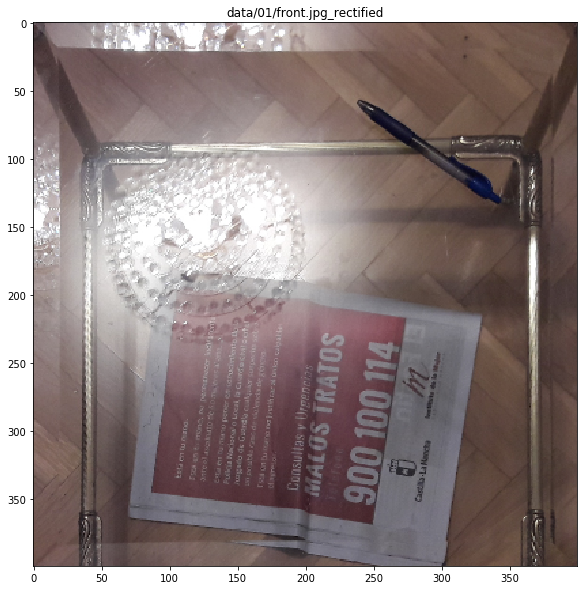

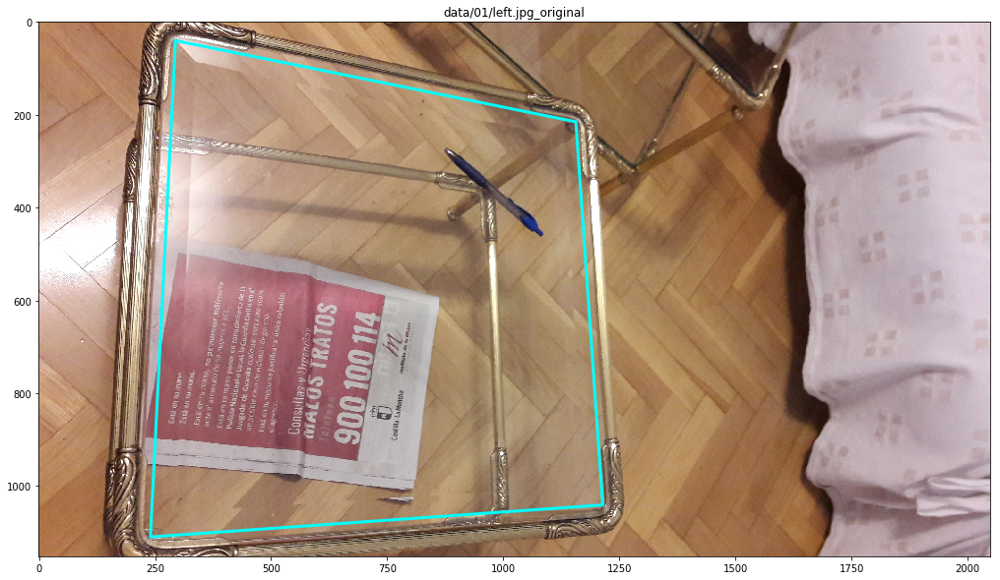

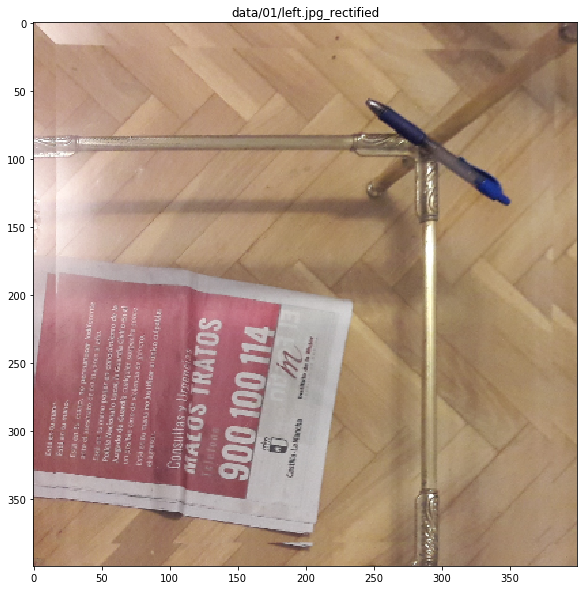

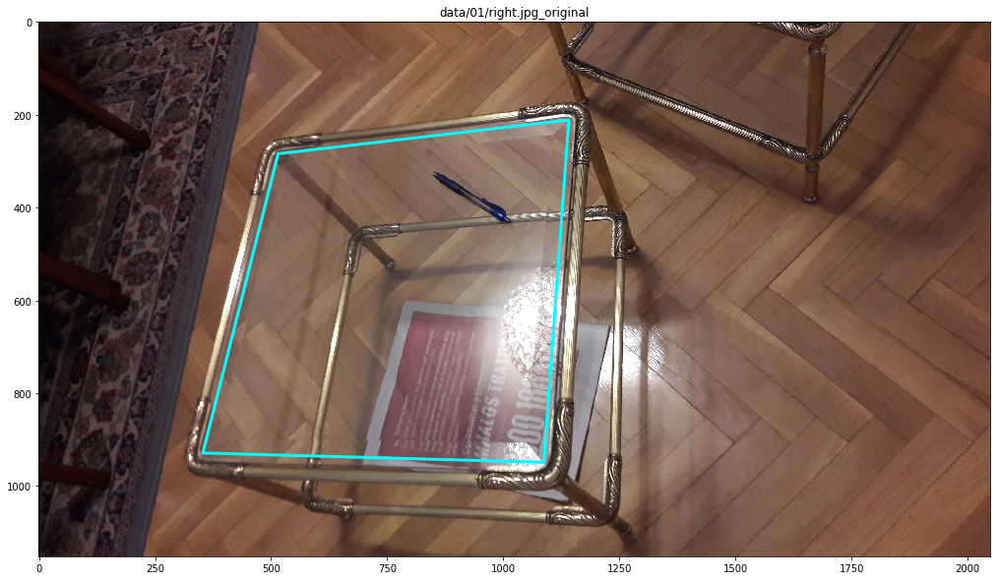

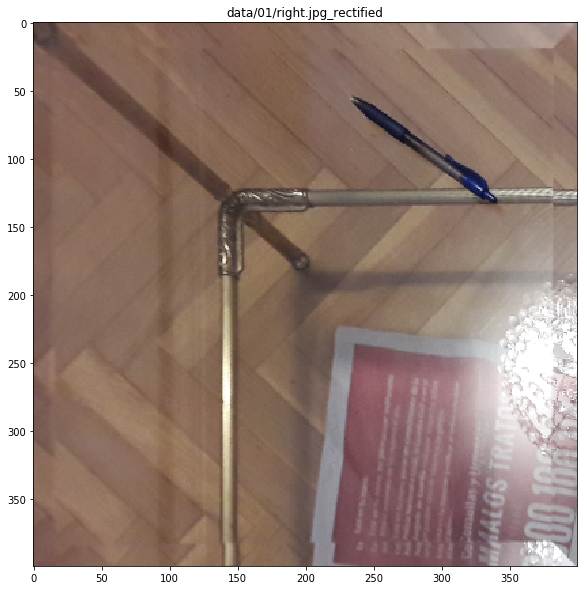

In [6]:
# Print results

for img in imgs:
    visual.imshow(
        cv2.imread(img['path']),  # Original image
        img['path']+"_original",
        roi=img['shape']  # Region of Interest
    )
    visual.imshow(
        img['img'],
        img['path']+"_rectified"
    )

# Detect opacities

## SIFT points

* https://docs.opencv.org/3.1.0/da/df5/tutorial_py_sift_intro.html
* https://pythonhosted.org/sift_pyocl/sift.html

In [7]:
for img in imgs:
    img['kps'] = sift.extract_kps(img['img'])

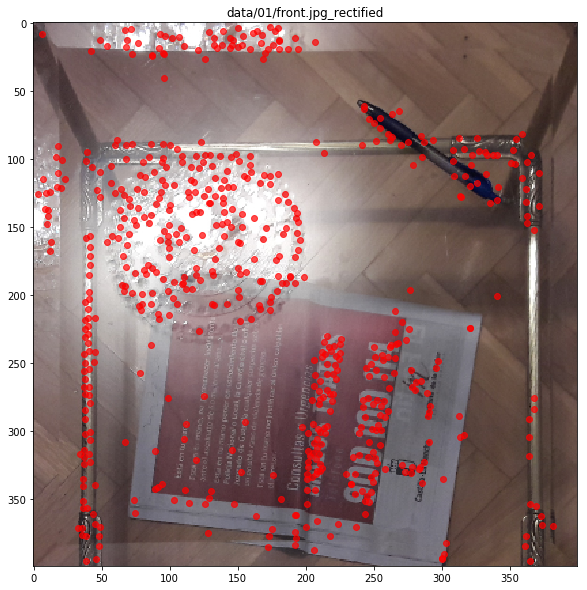

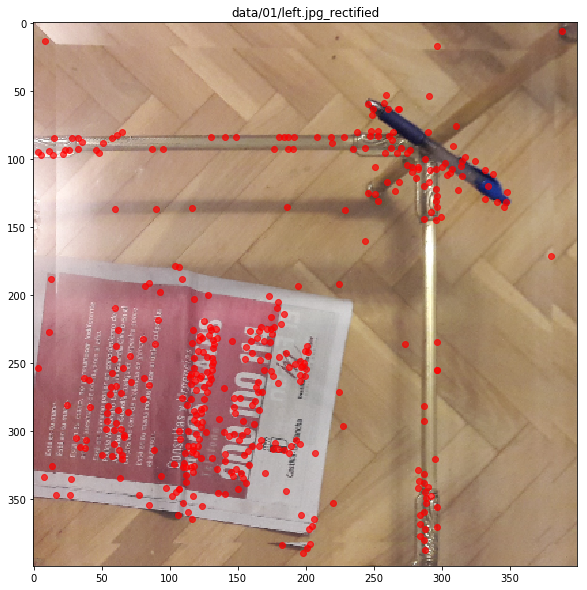

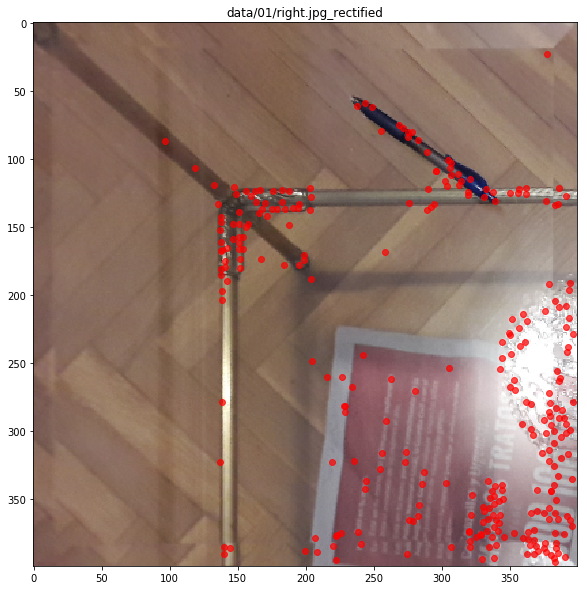

In [8]:
# Print results

for img in imgs:
    visual.imshow(
        img['img'],
        img['path']+"_rectified",
        points=img['kps'].keys()
    )


## Parallax

In [9]:
# Hyperparameters

DIST_THRESHOLD = 7  #px
SIMILARITY = 'euclidean'

sim_func = sift.SIMILARITIES[SIMILARITY]['f']
sim_thres = sift.SIMILARITIES[SIMILARITY]['t']

In [10]:
# Calculate fixed points

opacities_sift = sift.calculate_opacities(
    imgs_kps=[img['kps'] for img in imgs],
    dist_threshold=DIST_THRESHOLD,
    sim_func=sim_func,
    sim_threshold=sim_thres
)



=== New Pair ===



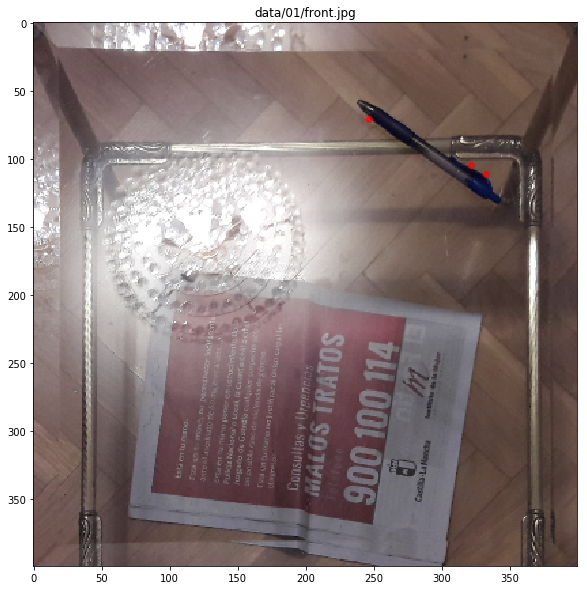

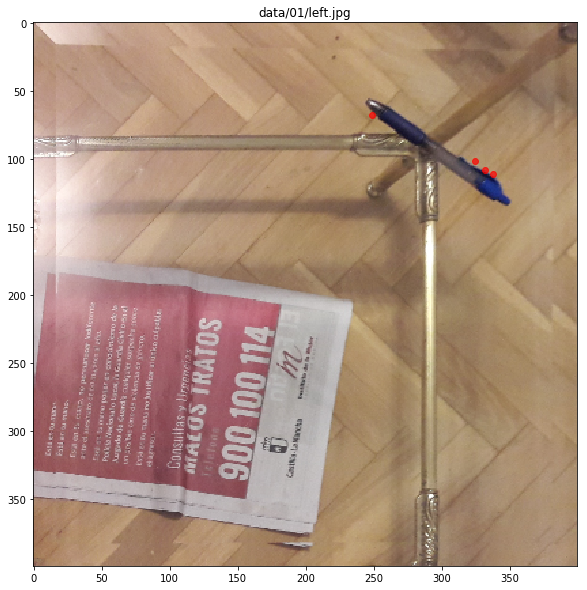



=== New Pair ===



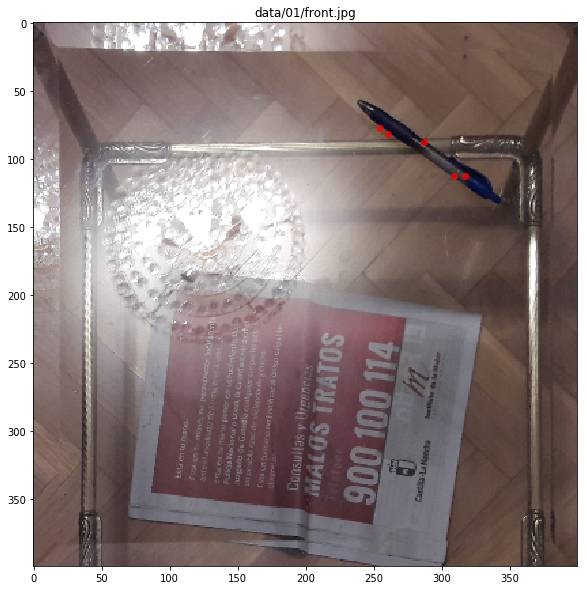

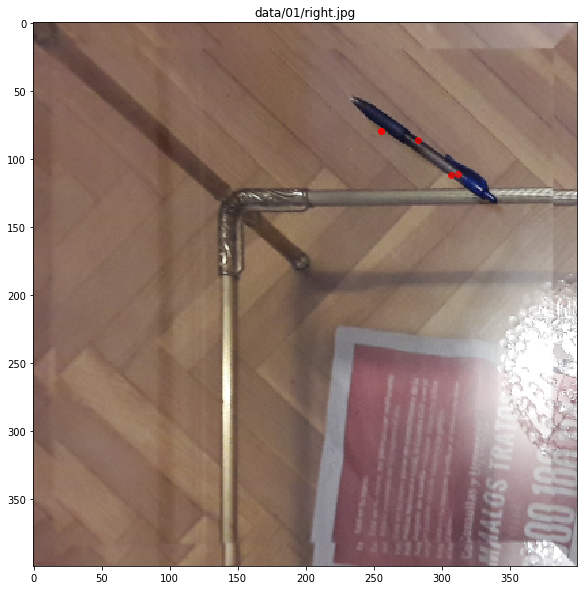



=== New Pair ===



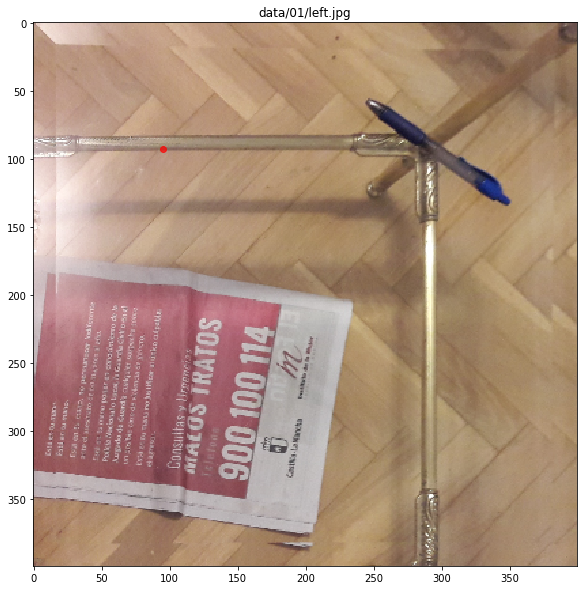

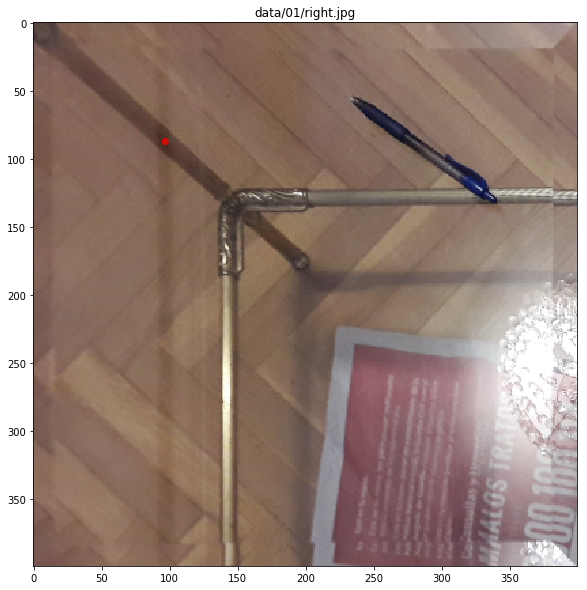

In [11]:
# Print results

import itertools

for (img1, img2), points in zip(
    itertools.combinations(imgs, 2),
    opacities_sift
    ):
        # Get points
        p1s, p2s = [], []
        for pt1, pts2 in points:
            p1s.append(pt1['kp'].pt)
            p2s.extend([x['kp'].pt for x in pts2])        
        # Show imgs
        print("\n\n=== New Pair ===\n")
        visual.imshow(img1['img'], img1['path'], points=p1s)
        visual.imshow(img2['img'], img2['path'], points=p2s)

# Combine results

In [12]:
point_confidence = sift.opacities2confidence(
    opacities_sift,
    sim_func= lambda kp1,kp2: sift.pair_similarity(kp1, kp2, sim_func=sift.SIMILARITIES[SIMILARITY]['f'])
)

In [13]:
# Print Rank

point_confidence

[((337.737548828125, 111.00376892089844), 1.0),
 ((306.7144775390625, 111.5907974243164), 0.9416175218739289),
 ((309.069091796875, 112.5095443725586), 0.9416175218739289),
 ((254.74232482910156, 77.12145233154297), 0.8390411688392451),
 ((312.4099426269531, 111.31233978271484), 0.7959969104312442),
 ((317.0262756347656, 112.79195404052734), 0.7959969104312442),
 ((255.6691131591797, 79.19993591308594), 0.7662601098271065),
 ((332.4164733886719, 111.52542114257812), 0.7527321022334317),
 ((282.3663635253906, 86.19863891601562), 0.7445432460899138),
 ((286.8382263183594, 87.67974853515625), 0.7445432460899138),
 ((260.59454345703125, 81.6390151977539), 0.7050977246948763),
 ((331.62103271484375, 107.89865112304688), 0.6035047511295032),
 ((248.7524871826172, 67.58768463134766), 0.5718996824786247),
 ((246.41458129882812, 70.70326232910156), 0.5718996824786247),
 ((95.34642028808594, 92.91307830810547), 0.5666993559437014),
 ((96.28522491455078, 87.24298858642578), 0.5666993559437014),
 

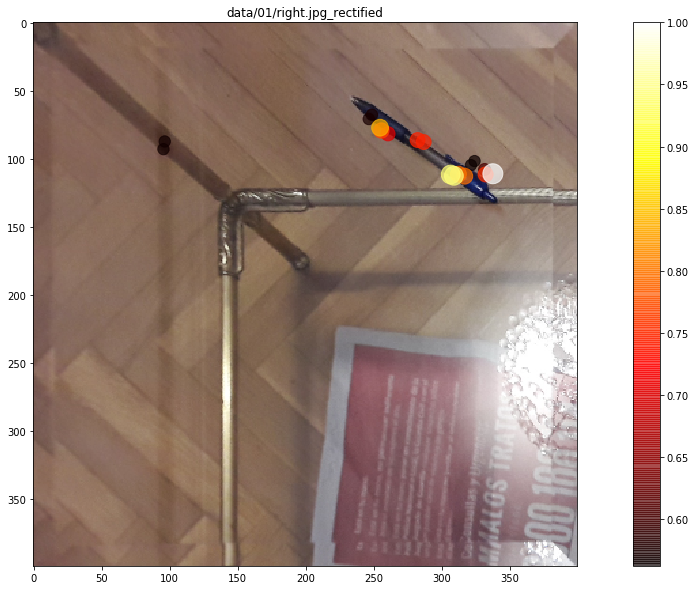

In [14]:
# Print results

visual.imshow(
    img['img'],
    img['path']+"_rectified",
    points=[pt for pt,_ in point_confidence],
    weights=[score for _,score in point_confidence]
)

# With other dataset

In [15]:
PATH_DATASET = 'data/02'

In [16]:
data = dataset.load(PATH_DATASET)
imgs = data['imgs']
shape_canonical = data['shape_canonical']

In [17]:
for img in imgs:
    # Rectified image
    img['img'],_ = perspective.rectify(
        rectified_shape=np.float32(shape_canonical),
        img=cv2.imread(img['path']),
        roi=np.float32(img['shape'])
    )
    # Keypoints
    img['kps'] = sift.extract_kps(img['img'])

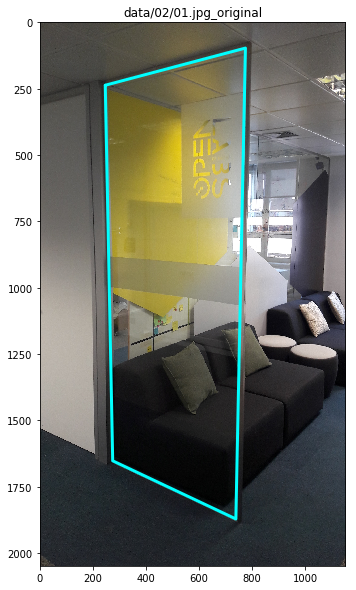

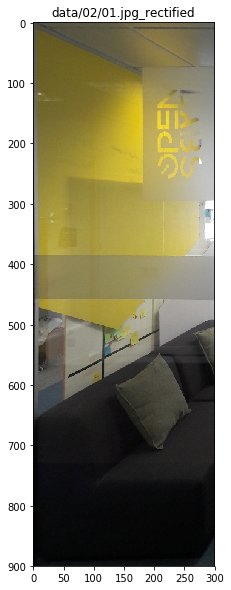

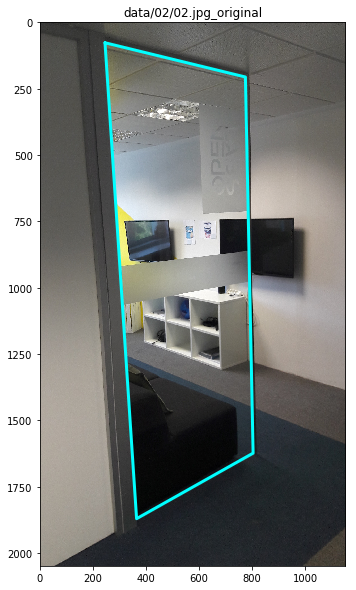

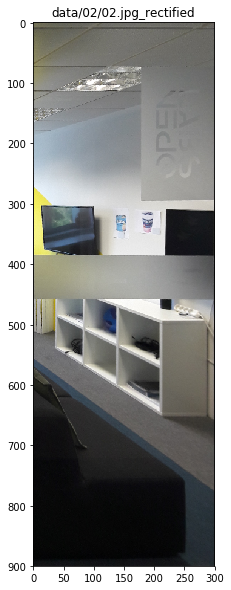

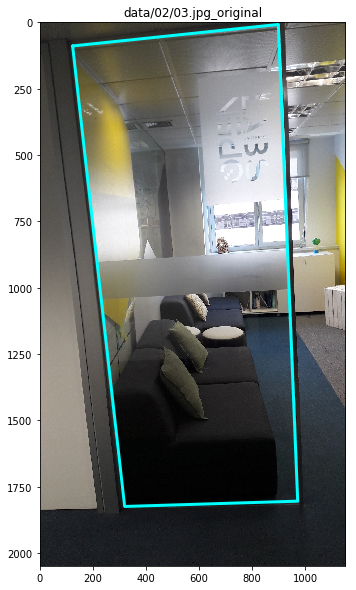

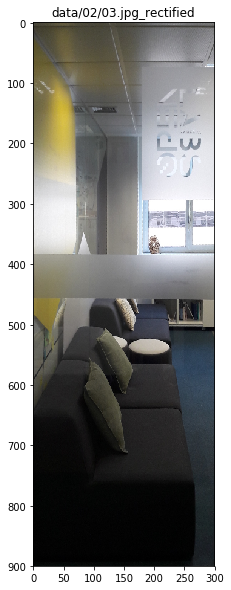

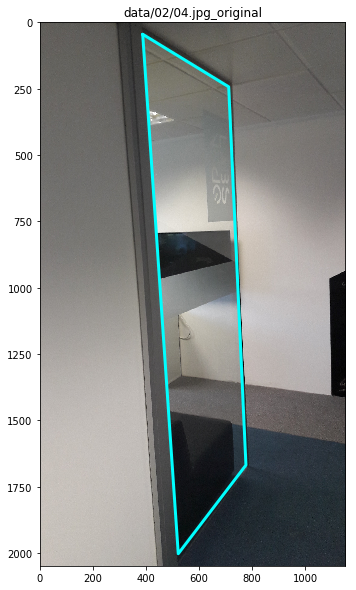

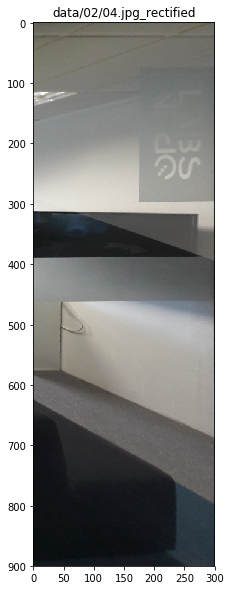

In [18]:
# Print results

for img in imgs:
    visual.imshow(
        cv2.imread(img['path']),  # Original image
        img['path']+"_original",
        roi=img['shape']  # Region of Interest
    )
    visual.imshow(
        img['img'],
        img['path']+"_rectified"
    )

In [19]:
# Hyperparameters

DIST_THRESHOLD = 7  #px
SIMILARITY = 'euclidean'

sim_func = sift.SIMILARITIES[SIMILARITY]['f']
sim_thres = sift.SIMILARITIES[SIMILARITY]['t']

In [20]:
# Calculate fixed points

opacities_sift = sift.calculate_opacities(
    imgs_kps=[img['kps'] for img in imgs],
    dist_threshold=DIST_THRESHOLD,
    sim_func=sim_func,
    sim_threshold=sim_thres
)

point_confidence = sift.opacities2confidence(
    opacities_sift,
    sim_func= lambda kp1,kp2: sift.pair_similarity(kp1, kp2, sim_func=sift.SIMILARITIES[SIMILARITY]['f'])
)

In [21]:
point_confidence

[((103.08357238769531, 387.36602783203125), 1.0),
 ((100.4063491821289, 386.5738525390625), 1.0),
 ((274.21856689453125, 194.55935668945312), 0.8655702026079874),
 ((275.15283203125, 196.23306274414062), 0.8655702026079874),
 ((7.566606044769287, 461.3016357421875), 0.8199021676765231),
 ((4.659812927246094, 459.0712890625), 0.8199021676765231)]

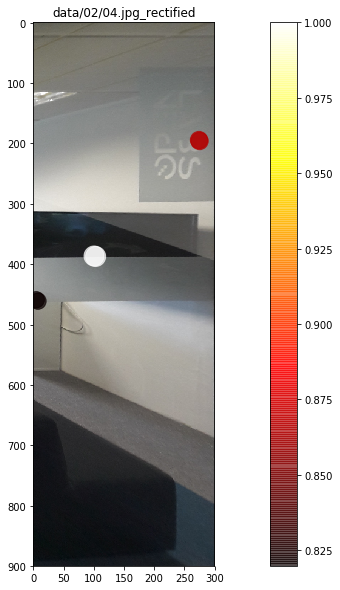

In [22]:
visual.imshow(
    img['img'],
    img['path']+"_rectified",
    points=[pt for pt,_ in point_confidence],
    weights=[score for _,score in point_confidence]
)